In [68]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from matplotlib.patches import Rectangle

In [69]:
def criar_indices(min_i, max_i, min_j, max_j):
    import itertools
    L = list(itertools.product(range(min_i, max_i), range(min_j, max_j)))
    idx_i = np.array([e[0] for e in L])
    idx_j = np.array([e[1] for e in L])
    idx = np.vstack( (idx_i, idx_j) )
    return idx

In [70]:
import numpy as np

def apply_transform(image, A):

    image_ = np.zeros_like(image)

    Xd = criar_indices(0, image.shape[0], 0, image.shape[1])
    Xd = np.vstack((Xd,np.ones((1,Xd.shape[1]))))
    
    X = np.linalg.inv(A) @ Xd

    X = X.astype(int)
    Xd = Xd.astype(int)

    filtro = (X[0,:]>=0)&(X[0,:]<image_.shape[0])&(X[1,:]>=0)&(X[1,:]<image_.shape[1])
    Xd = Xd[:,filtro]
    X = X[:,filtro]

    image_[Xd[0,:], Xd[1,:], :] = image[X[0,:], X[1,:], :]
    
    return image_


def resize_image_matrix(image, width, height):
    
    tw_image = width / image.shape[1]
    th_image = height / image.shape[0]

    return np.array([
        [th_image, 0, 0], 
        [0, tw_image, 0], 
        [0, 0, 1]
    ])
    
def resize_image(image, width, height):
    A = resize_image_matrix(image, width, height)
    return apply_transform(image, A)
    
def translate_image_matrix(x, y):
    return np.array([
        [1, 0, y], 
        [0, 1, x], 
        [0, 0, 1]
    ])
    
def translate_center_matrix(image):
    return np.array([
        [1, 0, int(-image.shape[0]/2)], 
        [0, 1, int(-image.shape[1]/2)], 
        [0, 0, 1]
    ])
    
def rotate_image_matrix(deg):
    
    return np.array([
        [np.cos(np.radians(deg)), -np.sin(np.radians(deg)), 0], 
        [np.sin(np.radians(deg)), np.cos(np.radians(deg)), 0], 
        [0, 0,1]
    ])
    
def rotate_image(image, deg):
    B = translate_center_matrix(image)
    A = rotate_image_matrix(deg)
    C = np.linalg.inv(B) @ A @ B
    return apply_transform(image, C)

In [71]:
def reshape(x, shape):
    if x == 0:
        return int(shape/5)
    return int(x*4/5)

In [72]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg
import cv2

# Read the image
image = mpimg.imread("C:/Users/jalfr/OneDrive/Desktop/MASP/Code/Test/bounding_box/bounding_box_test/img/WEB_JB_MASP_00112_01.jpg")

fundo = mpimg.imread("C:/Users/jalfr/OneDrive/Desktop/MASP/Code/Test/bounding_box/bounding_box_test/img/6R0A8419.jpg")

height = image.shape[0]
width = image.shape[1]

src_points = np.float32([[0, 0], 
                         [0, image.shape[0]], 
                         [image.shape[1], 0], 
                         [image.shape[1], image.shape[0]]])

dst_points = []

for pair in src_points:
    l = []
    for i in range(len(pair)):
        print(pair[i])
        l.append(reshape(pair[i], image.shape[(i+1)//2]))
    dst_points.append(l)
    
dst_points = np.float32(dst_points)

all_points = [src_points, dst_points]

all_dst_points = []

for i in range(2):
    li = [all_points[i][0], None, None, None]
    for j in range(2):
        li[1] = all_points[j][1]
        for k in range(2):
            li[2] = all_points[k][2]
            for l in range(2):
                li[3] = all_points[l][3]
                all_dst_points.append(np.float32(li))

0.0
0.0
0.0
2000.0
1693.0
0.0
1693.0
2000.0


<Figure size 1500x1500 with 0 Axes>

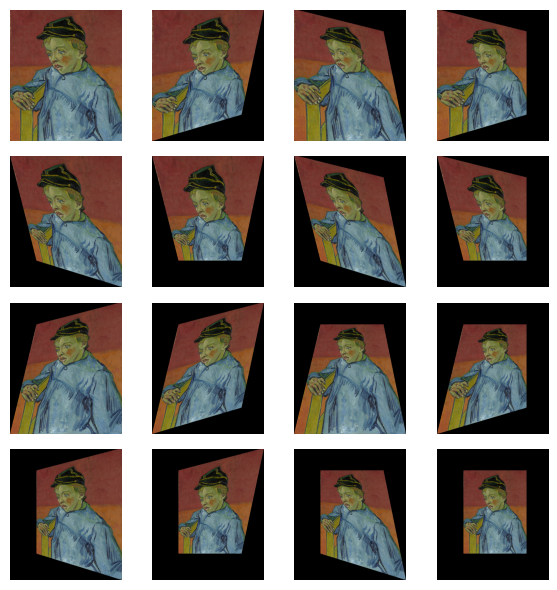

In [73]:
plt.figure(figsize=(15, 15))
fig, axs = plt.subplots(4, 4, figsize=(6, 6))

for i in range(len(all_dst_points)):
    
    # Get the perspective transformation matrix
    matrix = cv2.getPerspectiveTransform(src_points, all_dst_points[i])

    # Perform the perspective warp
    image_ = cv2.warpPerspective(image, matrix, (image.shape[1], image.shape[0]))
    axs[int(i/4), i%4].imshow(image_)
    plt.axis('off')

# Remover os eixos
for ax in axs.flat:
    ax.axis('off')

# Exibir as imagens
plt.tight_layout()
plt.show()

<Figure size 4000x4000 with 0 Axes>

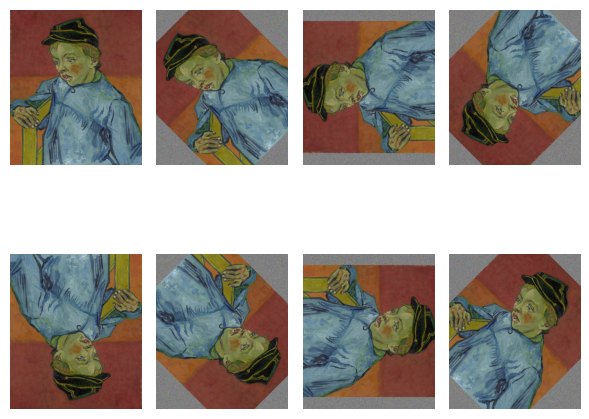

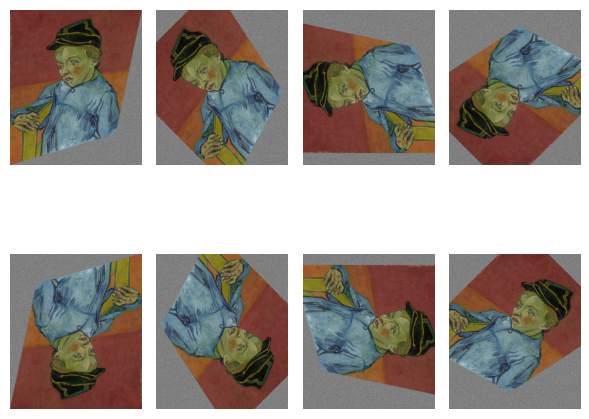

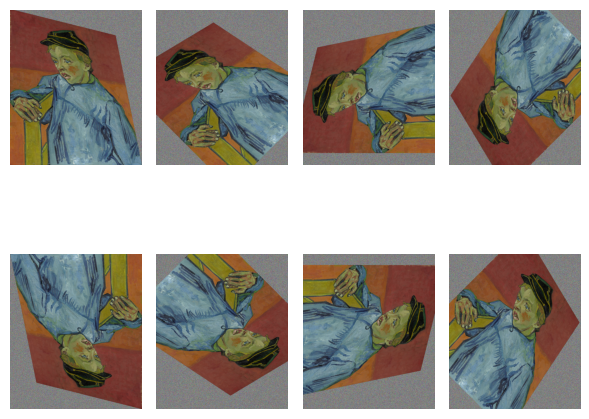

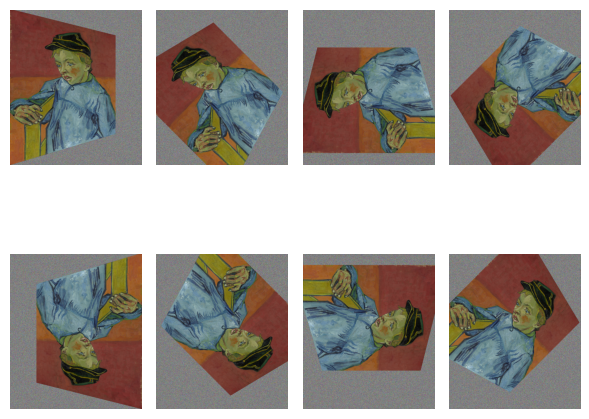

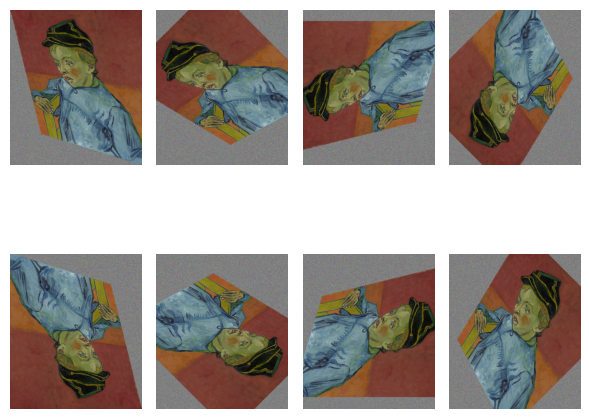

...

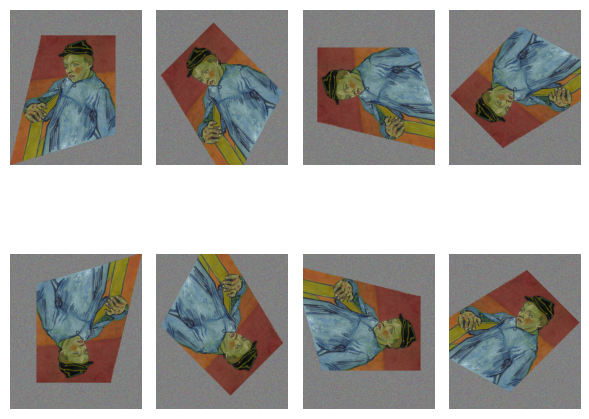

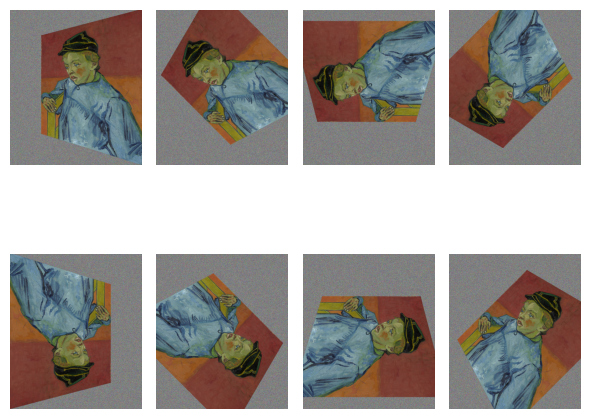

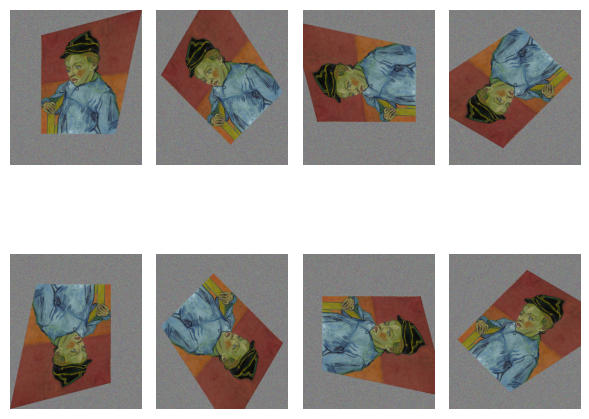

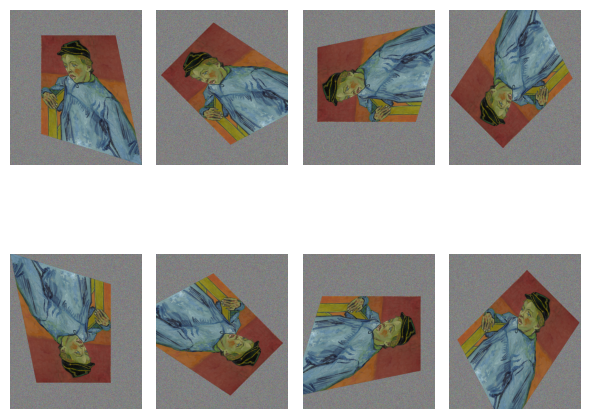

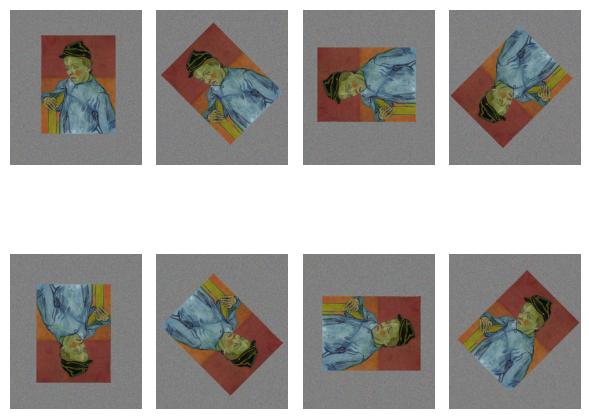

In [88]:
plt.figure(figsize=(40, 40))

for i in range(len(all_dst_points)):
    fig, axs = plt.subplots(2, 4, figsize=(6, 6))

    # Get the perspective transformation matrix
    matrix = cv2.getPerspectiveTransform(src_points, all_dst_points[i])

    for j in range(8):
        
        # Perform the perspective warp
        image_ = cv2.warpPerspective(image, matrix, (image.shape[1], image.shape[0]))
        image_ = rotate_image(image_, j * 45)
        
        matrix_shape = (image.shape[0], image.shape[1], 3)
        fundo = np.random.randint(256, size=matrix_shape) 
        condition = image_ == [0,0,0]
        image_[condition] = fundo[condition]
        
        
        axs[int(j/4), j%4].imshow(image_)
        axs[int(j/4), j%4].axis('off')
        
    plt.subplots_adjust(wspace=0.03, hspace=0.00)
    plt.tight_layout()
    plt.show()

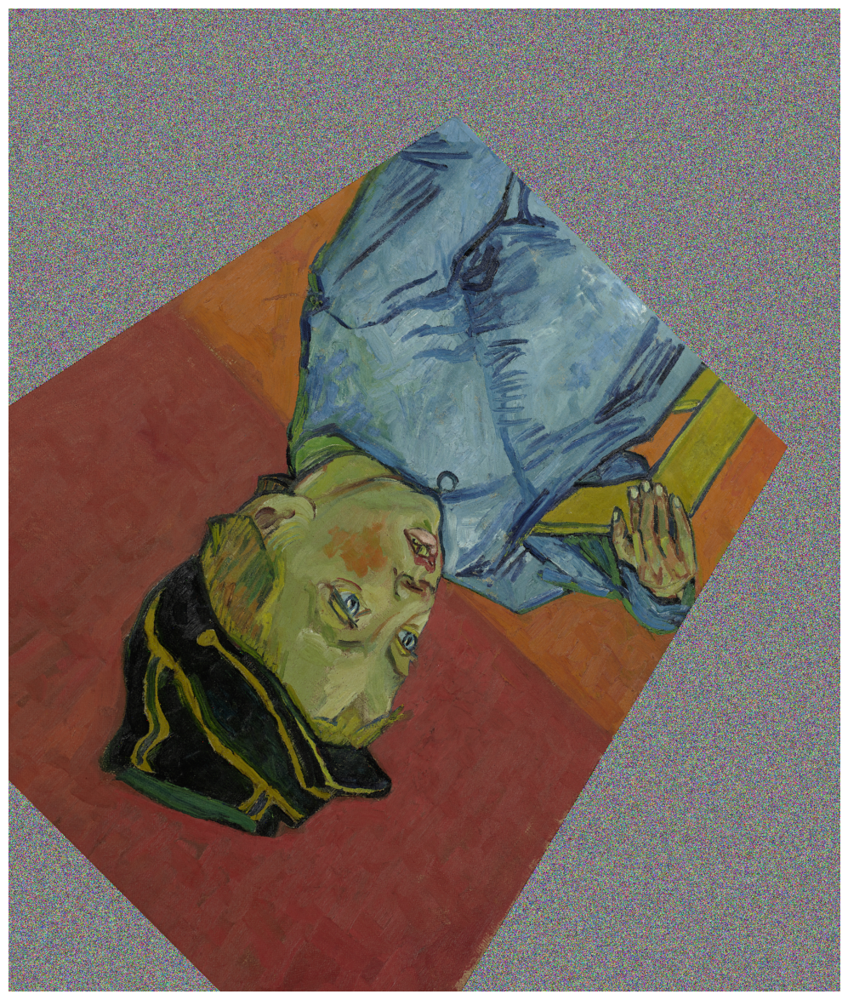

In [87]:
plt.figure(figsize=(15, 15))


# Get the perspective transformation matrix
matrix = cv2.getPerspectiveTransform(src_points, all_dst_points[5])
  
# Perform the perspective warp
image_ = cv2.warpPerspective(image, matrix, (image.shape[1], image.shape[0]))
image_ = rotate_image(image_, 3 * 45)

matrix_shape = (image.shape[0], image.shape[1], 3)
fundo = np.random.randint(256, size=matrix_shape) 
condition = image_ == [0,0,0]
image_[condition] = fundo[condition]


plt.imshow(image_)
plt.axis('off')

plt.show()